In [6]:
# !pip install opencv-python

In [7]:
from IPython.display import HTML

HTML('''<script>
code_show=true;
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
}
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()">
<input type="submit" value="Click here to toggle on/off the raw code.">
</form>''')

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 
from pathlib import Path

from tqdm import tqdm
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# import PIL
from PIL import Image
import pickle
import random
import gc
import cv2

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(2)
from tensorflow.keras import models, layers, optimizers, applications
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

import keras_cv_attention_models

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-8oqzu71q because the default path (/home/macot/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


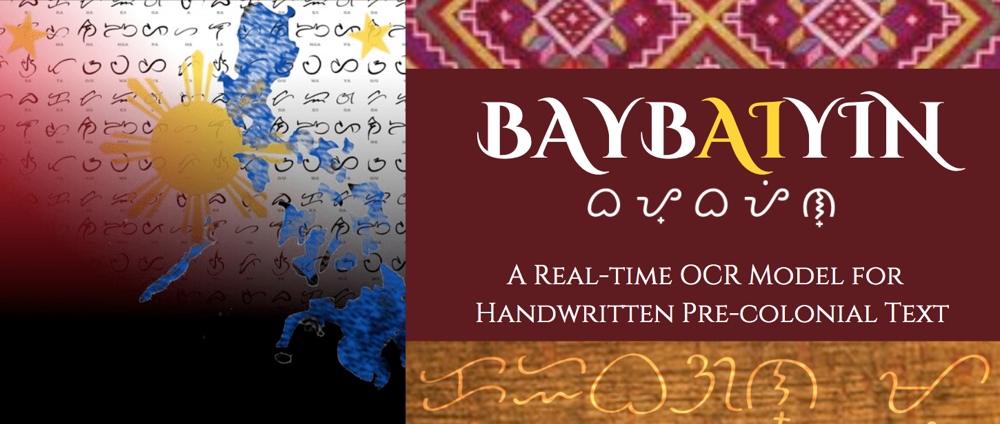

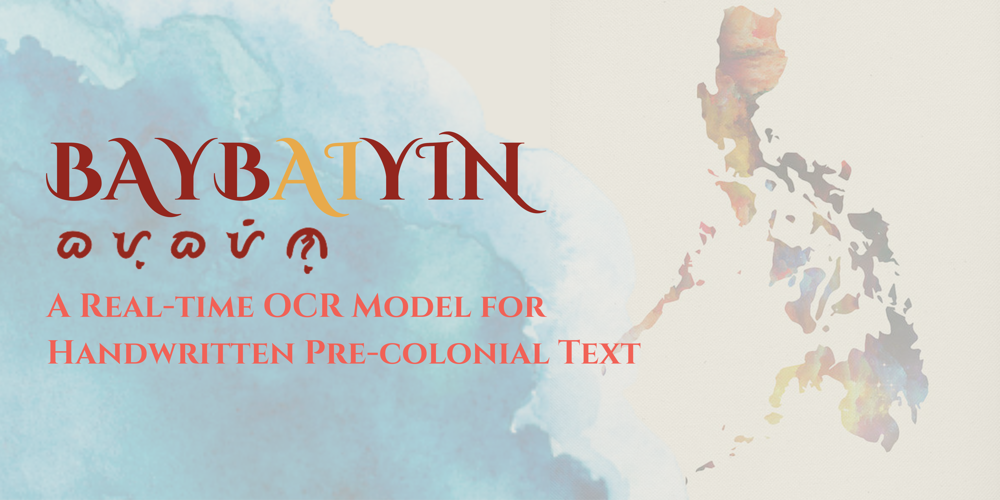

## <font color="93261e"> I. Executive Summary </font>

## <font color="e8aa4b"> II. Introduction </font>

Early Filipinos used Baybayin as one of their pre-colonial writing systems. Baybayin is derived from the Tagalog root word _baybay_, which means _"to spell,"_ and has been an integral part of Filipino culture and heritage. For many years, the script was wrongly referred to as "alibata," based on the layout of another alphabet system – Arabic. When the Spaniards arrived in the Philippines, they discovered that the majority of the natives, not only the elite, could read and write. The script was not only used for recording purposes, but it was also used to sign documents, write poetry, incantations, and letters. It was a common means of communication that was highly respected by the explorers who visited the islands.

Baybayin is an alphasyllabary. Each character is built around a consonant letter, with a vowel indication denoting the vowel sound it represents. It has `14` syllabic consonant characters and `3` vowel symbols. Each consonant symbol combines the consonant sound with the vowel sound "a." A _kudlit_ or mark is added on top of the character to alter this to the "e-i" sound, and for the "o-u" sound, the mark is placed at the bottom. 

The Spanish friars studied Baybayin and used it to teach Filipinos about the Catholic faith. To signify consonants that stand alone, the Spanish affixed a cross symbol at the bottom of Baybayin letters. As the colonizers brought their own method of writing, Baybayin was gradually superseded by the Latin alphabet, and its use dwindled and eventually died down. In recent years, however, Baybayin has seen a comeback in popularity, especially with Filipino millennials and young professionals. Baybayin calligraphy and fonts have captivated the digital generation, with tattoos, garments, posters, accessories, and mobile apps all featuring them. Government agencies, cultural organizations, and artists are all working to revive the archaic writing system. It is taught in classrooms, workshops, and public presentations.

The United Nations has chosen 2019 to be the International Year of Indigenous Languages. This is to raise awareness about how `40%` of the world's estimated 6,700 languages are on the verge of extinction, with the bulk of them being archaic scripts used by indigenous peoples. Baybayin is one of the several indigenous scripts in the Philippines that almost died out until it regained popularity.

The goal of the project is to utilize deep learning to answer the call for cultural preservation and provide assistance and encouragement in keeping the Philippine legacy alive. A dataset of `38,000` photos of `19` different handwritten baybayin characters, each with a few thousand samples, is used to develop an **Optical Character Recognition** model. Various models were considered such as a baseline `Convolutional Neural Network`, popular computer vision architectures like `VGG16`, `EfficientNet B0`, and `ResNet`, and lastly, `CoAtNet`, a state-of the-art architecture currently ranking highest on image classification. After training the data on 5 different models, the model that obtained the best test performance was `VGG16` with an accuracy of **98.51%**.

## <font color="93261e"> III. Motivation of the Study </font>

The government has promoted the use of Baybayin through Philippine House Bill 1022, otherwise known as the "National Writing System Act". The bill declares the need to remote, protect, preserve and conserve Baybayin and use it as a tool for cultural and economic development. According to the bill, it will require all manufacturers of locally produced processed food products to inscribe Baybayin scripts and translations in the labels, mandate local government units (LGUs) to include Baybayin in the street signage for street names, public facilities, and public buildings, among others. This study can help prepare for the prevalence of Baybayin in the near future. Apps that can translate Baybayin in real time can use this model to help the public in reading the Baybayin scripts in documents or in public places.

Moreover, Baybayin calls us to remember our roots and be proud of our Filipino legacy. As aspiring Filipino data scientists, applying the deep learning models that we have learned is our way of answering the call for cultural preservation and enhance pride for the Filipino identity.


## <font color="e8aa4b"> IV. Problem Statement </font>

To help preserve our Filipino heritage, we focused on answering the following questions. 


<div class="alert alert-block alert-danger"><center>How can we use deep learning models to predict the Baybayin characters? How can we deploy this model to allow real-time classification of Baybayin characters?</center></div>

## <font color="93261e"> V. Data Source </font>

The dataset used was sourced from Github, at https://github.com/jmbantay/Baybayin-Handwritten-Character-Dataset. It is comprised of 38,398 images of 19 different handwritten baybayin characters, with the distribution as follows:

* 14 consonants, each with 2000 to 2500 samples
    * *ba, da/ra, ga, ha, ka, la, ma, na, nga, pa, sa, ta, wa,* and *ya*
* 3 vowels, each with about 1,300 samples
    * *a, e/i,* and *o/u*
* 2 special characters indicating punctuation or pauses, each with about  1,000 samples
    * "/" or *kuw* (short for “kuwit”) and "//" or *tul* (short for “tuldok”)
    
It may be noted that by default, consonants are followed by the vowel sound “a”. While there are accent marks (such as a dot, bar, or cross) used in baybayin to modify the succeeding vowel sound into “e/i” or “o/u” or cancel them out altogether, these are not standardized and do not comprise part of the dataset.

## <font color="e8aa4b"> VI. Methodology </font>

The approach in tackling the problem is outlined by the figure below.

**1. Data Pre-processing and augmentation**

The dataset was first inspected to ascertain the shape and the optical features of the samples. This was then resized to 64x64 so that the input to the model will have a uniform shape. The data was also augmented to allow for slight shifts in rotation, scale, brightness, and shear of the images to help the trained models become more robust.

**2.  Model Training and Evaluation**

Five models were evaluated - a baseline convolutional neural network (CNN), VGG16, ResNet50, EfficientNetB0 and CoAtNet0. The dataset was split into a train-val and test set, and run for at least 30 epochs. Early stopping was used to avoid overfitting. The model was evaluated based on the accuracy metric. 


**3.  Implementation**

Once the best model was found, a real-time character recognition model was made using OpenCV and deployed it using a mobile camera or a video camera on handwritten Baybayin script that researchers wrote.

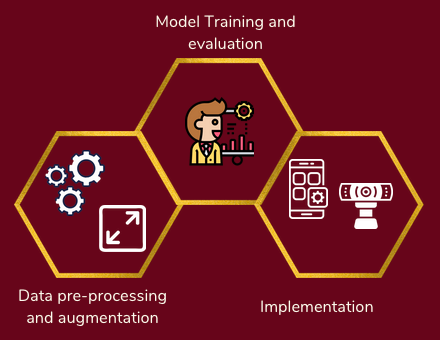

## <font color="93261e"> VII. Preparing and Exploring the Dataset </font>

Having downloaded the dataset from Github, the analysts proceeded to load the data and perform initial exploration. The distribution of samples are shown in both pie and bar plot form, below.

In [9]:
seed = 143
random.seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
tf.random.set_seed(seed)

In [3]:
data_dir = '/mnt/processed/private/msds2022/cpt11/ML3/Baybayin-Handwritten-Character-Dataset/raw/'
save_dir = '/mnt/processed/private/msds2022/cpt11/ML3/Baybayin-Handwritten-Character-Dataset/savefiles/'
size = 64
epochs = 30
val_split = 0.25

batch_size = 32

data_path = Path(data_dir)
images = sorted(list(map(str, list(data_path.glob("*/*.jpg")))))
labels = set([img.split(os.path.sep)[-2] for img in images])
num_labels = len(labels)

label_dict = {i: j for i, j in zip(range(19), sorted(labels))}

steps_per_epoch = len(images) * (1 - val_split) / batch_size
validation_steps = len(images) * val_split / batch_size

print("Number of images found: ", len(images))
print("Number of labels found: ", num_labels)
print("Labels:", sorted(labels))

dist = pd.Series([img.split(os.path.sep)[-2] for img in images]).value_counts()
PCC = sum(pd.Series([img.split(os.path.sep)[-2] for img in images]).
       value_counts(normalize=True)**2)

Number of images found:  38398
Number of labels found:  19
Labels: ['a', 'ba', 'dara', 'ei', 'ga', 'ha', 'ka', 'kuw', 'la', 'ma', 'na', 'nga', 'ou', 'pa', 'sa', 'ta', 'tul', 'wa', 'ya']


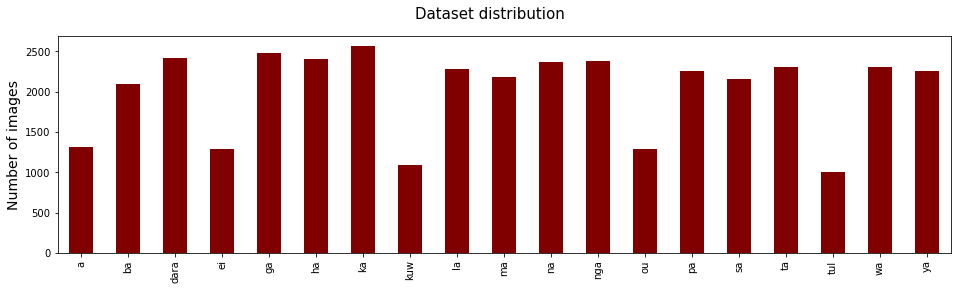

In [11]:
fig, ax = plt.subplots(figsize=(16, 4))
dist.sort_index().plot(kind='bar', color='maroon')
plt.ylabel('Number of images', fontsize=14)
plt.suptitle('Dataset distribution', fontsize=15)
plt.show()

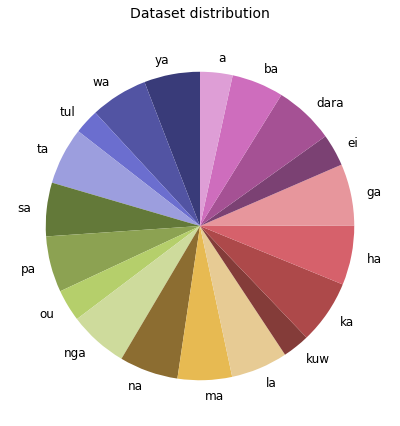

In [12]:
fig, ax = plt.subplots(figsize=(6, 6))
dist.sort_index(ascending=False).plot(kind='pie', fontsize=12,
                                      startangle=90, cmap='tab20b')
plt.ylabel('')
plt.suptitle('Dataset distribution', fontsize=14)
plt.tight_layout()
plt.show()

Given the distribution of the 19 image classes, the team computed the Proportional Chance Criterion (PCC) as 5.596%, resulting in a target model accuracy of at least 6.996%, based on the heuristic of 1.25 multiplied by the PCC.

In [13]:
print(f'PCC: {PCC:.3%}')
print(f'PCC x 1.25: {1.25*PCC:.3%}')

PCC: 5.596%
PCC x 1.25: 6.996%


The team also took a look at a sampling of images as well. Here are images of the 14 consonants. It may be observed that the images are closely cropped and of varying dimensions, ranging from about 50 to 100 pixels in height and width.

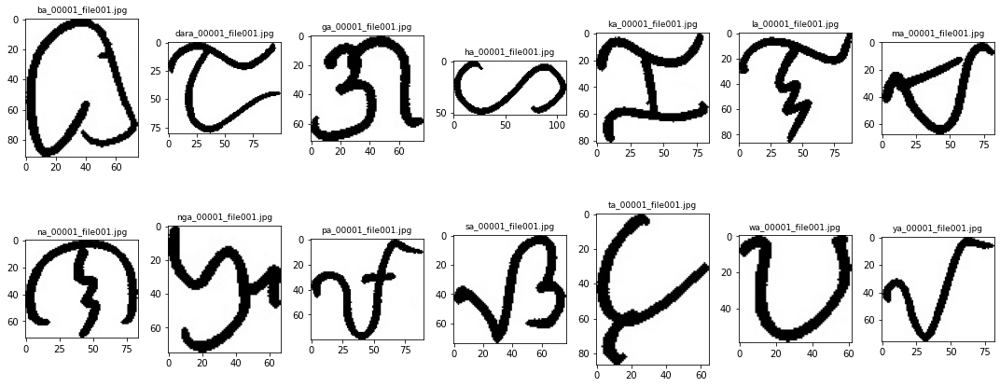

In [14]:
img_list = ['ba/ba_00001_file001.jpg',
            'dara/dara_00001_file001.jpg',
            'ga/ga_00001_file001.jpg',
            'ha/ha_00001_file001.jpg',
            'ka/ka_00001_file001.jpg',
            'la/la_00001_file001.jpg',
            'ma/ma_00001_file001.jpg',
            'na/na_00001_file001.jpg',
            'nga/nga_00001_file001.jpg',
            'pa/pa_00001_file001.jpg',
            'sa/sa_00001_file001.jpg',
            'ta/ta_00001_file001.jpg',
            'wa/wa_00001_file001.jpg',
            'ya/ya_00001_file001.jpg']

plt.figure(figsize = (15,12))
for idx, image_path in enumerate(img_list):
    plt.subplot(4, 7, idx + 1)
    img = Image.open(data_dir + image_path).convert('RGB')
    plt.imshow(img)
#     plt.axis('off')
    plt.title(image_path.split('/')[1], fontsize=9)
plt.tight_layout()
plt.show()

***

#### OPTION 2

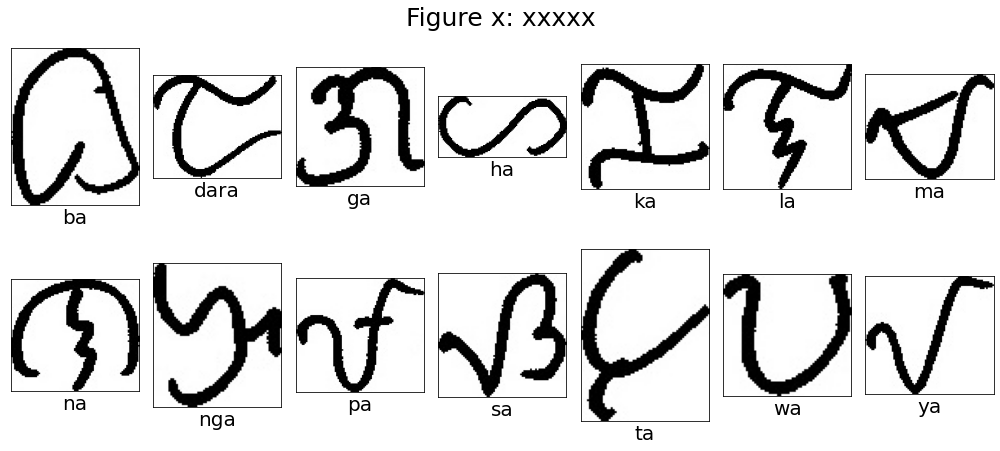

In [18]:
img_list = ['ba/ba_00001_file001.jpg',
            'dara/dara_00001_file001.jpg',
            'ga/ga_00001_file001.jpg',
            'ha/ha_00001_file001.jpg',
            'ka/ka_00001_file001.jpg',
            'la/la_00001_file001.jpg',
            'ma/ma_00001_file001.jpg',
            'na/na_00001_file001.jpg',
            'nga/nga_00001_file001.jpg',
            'pa/pa_00001_file001.jpg',
            'sa/sa_00001_file001.jpg',
            'ta/ta_00001_file001.jpg',
            'wa/wa_00001_file001.jpg',
            'ya/ya_00001_file001.jpg']

labels = ['ba','dara', 'ga', 'ha', 'ka', 'la', 'ma',
          'na', 'nga', 'pa', 'sa', 'ta', 'wa', 'ya']


plt.figure(figsize = (14,12))
plt.suptitle("Figure x: xxxxx", fontsize=25);
for idx, image_path in enumerate(img_list):
    plt.subplot(4, 7, idx + 1)
    img = Image.open(data_dir + image_path).convert('RGB')
    plt.imshow(img)
    #plt.axis('off')
    #plt.title(image_path.split('/')[1], fontsize=9)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(labels[idx], fontsize=20)
plt.tight_layout()
plt.show()

#### OPTION 3

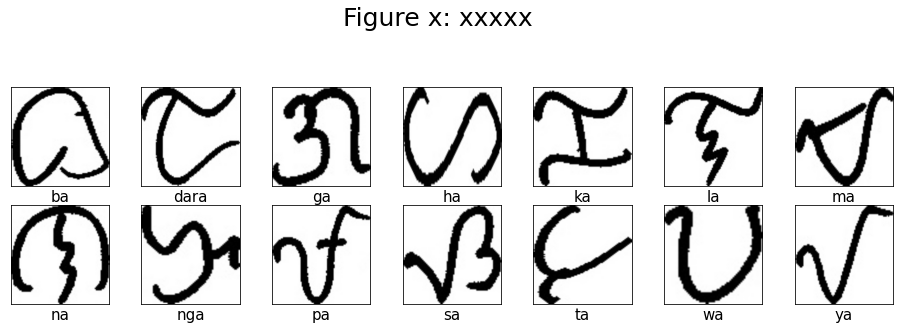

In [60]:
img_list = ['ba/ba_00001_file001.jpg',
            'dara/dara_00001_file001.jpg',
            'ga/ga_00001_file001.jpg',
            'ha/ha_00001_file001.jpg',
            'ka/ka_00001_file001.jpg',
            'la/la_00001_file001.jpg',
            'ma/ma_00001_file001.jpg',
            'na/na_00001_file001.jpg',
            'nga/nga_00001_file001.jpg',
            'pa/pa_00001_file001.jpg',
            'sa/sa_00001_file001.jpg',
            'ta/ta_00001_file001.jpg',
            'wa/wa_00001_file001.jpg',
            'ya/ya_00001_file001.jpg']
labels = ['ba','dara', 'ga', 'ha', 'ka', 'la', 'ma',
          'na', 'nga', 'pa', 'sa', 'ta', 'wa', 'ya']

images = []
plt.figure(figsize = (16,14));
for idx, image_path in enumerate(img_list):
    img = cv2.imread('raw/'+image_path)
    img = cv2.resize(img,(244,244))
    images.append(img)
    
#plt.figure(figsize = (15,12));
plt.suptitle("Figure x: xxxxx", fontsize=25);
    
for i in range(14):
    plt.subplot(7,7,i+1);
    plt.xticks([]);
    plt.yticks([]);
    plt.grid(False);
    plt.xlabel(labels[i], fontsize=15);
    plt.subplots_adjust(left  = 0.125,
                        right = 0.9,
                        bottom = 0.1,
                        top = 0.9,
                        wspace = 0.2,
                        hspace = 0.2)

    plt.imshow(images[i], cmap=plt.cm.binary);

Displayed below are sample images of the vowels, and characters denoting punctuation or pauses:

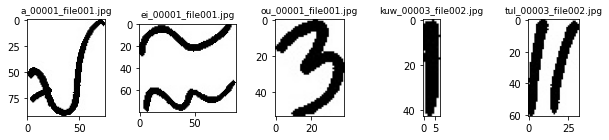

In [12]:
img_list = ['a/a_00001_file001.jpg',
            'ei/ei_00001_file001.jpg',
            'ou/ou_00001_file001.jpg',
            'kuw/kuw_00003_file002.jpg',
            'tul/tul_00003_file002.jpg']
labels = ['a','ei', 'ou', 'kuw', 'tul']
plt.figure(figsize = (12, 7))
for idx, image_path in enumerate(img_list):
    plt.subplot(4, 7, idx + 1)
    img = Image.open(data_dir + image_path).convert('RGB')
    plt.imshow(img)
#     plt.axis('off')
    plt.title(image_path.split('/')[1], fontsize=9)
plt.tight_layout()
plt.show()

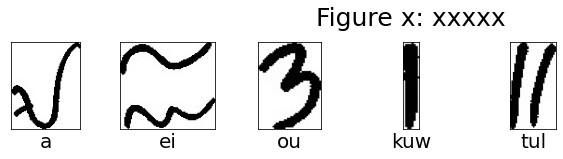

In [16]:
img_list = ['a/a_00001_file001.jpg',
            'ei/ei_00001_file001.jpg',
            'ou/ou_00001_file001.jpg',
            'kuw/kuw_00003_file002.jpg',
            'tul/tul_00003_file002.jpg']
labels = ['a','ei', 'ou', 'kuw', 'tul']
plt.figure(figsize = (12, 7))
plt.suptitle("Figure x: xxxxx", fontsize=25);
for idx, image_path in enumerate(img_list):
    plt.subplot(4, 7, idx + 1)
    img = Image.open(data_dir + image_path).convert('RGB')
    plt.imshow(img)
#     plt.axis('off')
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(labels[idx], fontsize=20)
    #plt.title(image_path.split('/')[1], fontsize=9)
    plt.subplots_adjust(left  = 0.125,
                        right = 0.9,
                        bottom = 0.1,
                        top = 0.9,
                        wspace = 0.2,
                        hspace = 0.2)
plt.tight_layout()
plt.show()

Having examined the images, data augmentation was performed to allow for slight shifts in rotation, scale, brightness, and shear of the images to help the trained models become more robust. All images were also scaled to 64x64 for uniformity of input for each of the deep learning models.

`DirectoryIterator` objects were then built to allow for training of the various deep learning architectures using Tensorflow. Different iterators were constructed for the models loaded from Keras to account for the pre-processing functions  already incporporated as a model layer during compilation.

The datasets were split into training and validation sets as well, with  an 80-20 split, resulting in 28,806 images for the training set and 9,592 images for the validation set.

In [43]:
# For Baseline CNN and CoAtNet:
# With scaling to 1/255

train_datagen = ImageDataGenerator(rescale=1./255,
                                   validation_split=val_split,
                                   preprocessing_function=None,
                                   rotation_range=20,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   brightness_range=[0.7, 1.3],
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   channel_shift_range=0.7,
                                   horizontal_flip=False,
                                   vertical_flip=False,)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 validation_split=val_split)


# Load data and turn into batches
train_data = train_datagen.flow_from_directory(data_dir,
                                               subset="training",
                                               target_size=(size, size),
                                               batch_size=batch_size,
                                               class_mode="categorical",
                                               seed=seed)

val_data = val_datagen.flow_from_directory(data_dir,
                                           subset="validation",
                                           target_size=(size, size),
                                           batch_size=batch_size,
                                           class_mode="categorical",
                                           seed=seed)

Found 28806 images belonging to 19 classes.
Found 9592 images belonging to 19 classes.


In [46]:
# For Keras Models (VGG16, EfficientNet, ResNet):
# Without scaling to 1/255, since this is already incorporated into
# pre-processing steps built as layer during model compilation

keras_train_datagen = ImageDataGenerator(validation_split=val_split,
                                   preprocessing_function=None,
                                   rotation_range=20,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   brightness_range=[0.7, 1.3],
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   channel_shift_range=0.7,
                                   horizontal_flip=False,
                                   vertical_flip=False,)

keras_val_datagen = ImageDataGenerator(validation_split=val_split)


# Load data and turn into batches
keras_train_data = keras_train_datagen.flow_from_directory(data_dir,
                                               subset="training",
                                               target_size=(size, size),
                                               batch_size=batch_size,
                                               class_mode="categorical",
                                               seed=seed)

keras_val_data = keras_val_datagen.flow_from_directory(data_dir,
                                           subset="validation",
                                           target_size=(size, size),
                                           batch_size=batch_size,
                                           class_mode="categorical",
                                           seed=seed)

Found 28806 images belonging to 19 classes.
Found 9592 images belonging to 19 classes.


## <font color="e8aa4b"> VIII. Results and Discussion </font>

### Models

#### CNN

<center><b>Figure x. CNN Network Architecture</b></center>

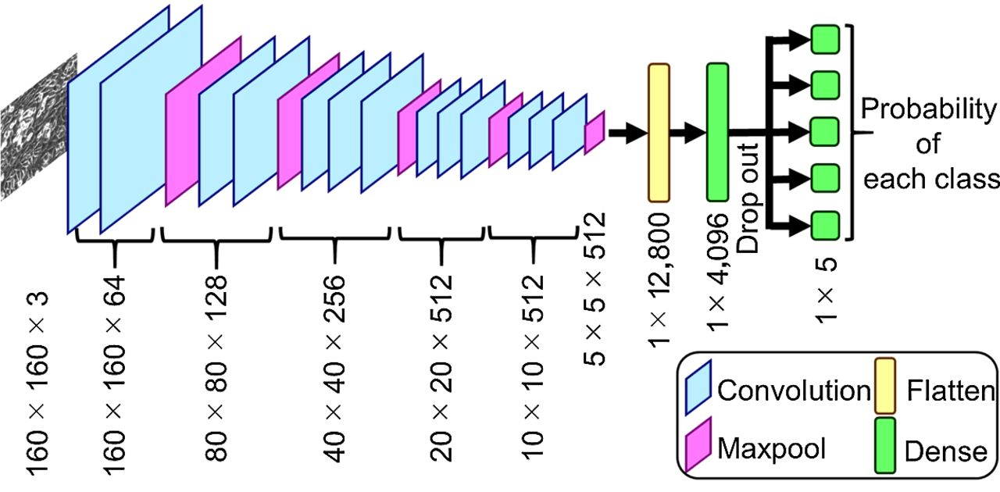

In [1]:
tf.keras.backend.clear_session()
gc.collect()

In [64]:
base_cnn = models.Sequential()

base_cnn.add(layers.Conv2D(filters=4, kernel_size=3, strides=1, padding='same',
                 input_shape=(size, size, 3)))
base_cnn.add(layers.BatchNormalization(axis=3))
base_cnn.add(layers.Activation('relu'))
base_cnn.add(layers.MaxPooling2D(pool_size=(2, 2)))

base_cnn.add(layers.Conv2D(filters=4, kernel_size=3, strides=1, padding='same',
                        activation='relu'))
base_cnn.add(layers.MaxPooling2D(pool_size=(3, 3)))

base_cnn.add(layers.Flat
             
             ten())
base_cnn.add(layers.Dense(32, activation="relu"))
base_cnn.add(layers.Dropout(0.6))

base_cnn.add(layers.Dense(num_labels, activation='softmax'))
base_cnn.summary()


base_cnn.compile(loss='categorical_crossentropy',
                 optimizer=optimizers.Adam(learning_rate=0.001),
                 metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 64, 64, 4)         112       
_________________________________________________________________
batch_normalization (BatchNo (None, 64, 64, 4)         16        
_________________________________________________________________
activation (Activation)      (None, 64, 64, 4)         0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 4)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 4)         148       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 10, 10, 4)         0         
_________________________________________________________________
flatten (Flatten)            (None, 400)               0

In [65]:
%%time

filepath_cnn = save_dir + "/base_cnn_wts.hdf5"
checkpoint_cnn = ModelCheckpoint(filepath_cnn, monitor='val_accuracy',
                             verbose=1, save_best_only=True, mode='max')
reduce_lr_cnn = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                                  patience=2, min_lr=0.00001, verbose=1)
earlystop_cnn = EarlyStopping(monitor='val_accuracy', patience=5, verbose=1)


base_cnn_history = base_cnn.fit(
    train_data,
    epochs=epochs,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    validation_data=val_data,
    callbacks=[checkpoint_cnn, reduce_lr_cnn, earlystop_cnn]
)

Epoch 1/30
899/899 [==============================] - 117s 130ms/step - loss: 2.6534 - accuracy: 0.1702 - val_loss: 1.4708 - val_accuracy: 0.6272

Epoch 00001: val_accuracy improved from -inf to 0.62719, saving model to ./savefiles/base_cnn_wts.hdf5
Epoch 2/30
899/899 [==============================] - 117s 130ms/step - loss: 2.1704 - accuracy: 0.3105 - val_loss: 1.0643 - val_accuracy: 0.7681

Epoch 00002: val_accuracy improved from 0.62719 to 0.76814, saving model to ./savefiles/base_cnn_wts.hdf5
Epoch 3/30
899/899 [==============================] - 117s 130ms/step - loss: 1.9710 - accuracy: 0.3675 - val_loss: 0.8629 - val_accuracy: 0.7809

Epoch 00003: val_accuracy improved from 0.76814 to 0.78086, saving model to ./savefiles/base_cnn_wts.hdf5
Epoch 4/30
899/899 [==============================] - 113s 126ms/step - loss: 1.8641 - accuracy: 0.3997 - val_loss: 0.8034 - val_accuracy: 0.7837

Epoch 00004: val_accuracy improved from 0.78086 to 0.78367, saving model to ./savefiles/base_cnn_

In [42]:
def plot_results(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))

    # plot accuracy 
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    epochs = range(1, len(acc) + 1)

    ax1.plot(epochs, acc, 'ko', label='Training acc')
    ax1.plot(epochs, val_acc, 'k', label='Validation acc')
    ax1.set_title('Training and validation accuracy')
    ax1.set_xlabel('Epochs')
    ax1.legend()

    # plot loss
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    ax2.plot(epochs, loss, 'ro', label='Training loss')
    ax2.plot(epochs, val_loss, 'r', label='Validation loss')
    ax2.set_title('Training and validation loss')
    ax2.set_xlabel('Epochs')
    ax2.legend()

In [67]:
base_cnn.load_weights(filepath_cnn)

base_cnn.save(save_dir + '/base_cnn.h5')

import pickle
with open(save_dir + '/base_cnn_hist.pickle', 'wb') as handle:
    pickle.dump(base_cnn_history.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

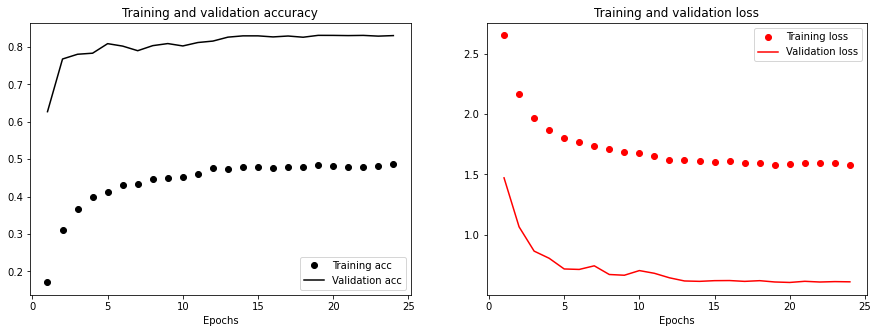

In [68]:
plot_results(base_cnn_history)

#### VGG16

<center><b>Figure x. VGG-16 Network Architecture</b></center>

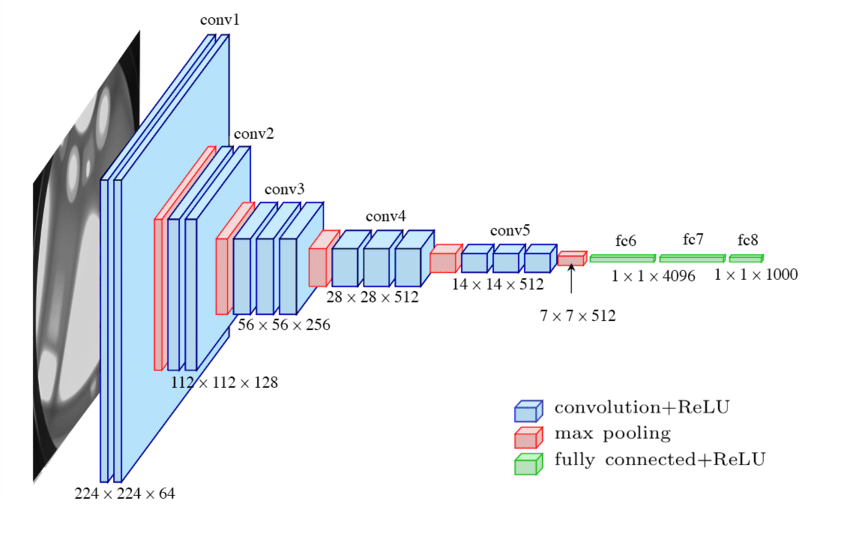

In [2]:
tf.keras.backend.clear_session()
gc.collect()

In [19]:
from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_vgg16

vgg16 = tf.keras.applications.VGG16(weights=None,
                  include_top=False)

model_vgg16 = models.Sequential()
model_vgg16.add(layers.Lambda(preprocess_vgg16,
                             input_shape=(size, size, 3)))
model_vgg16.add(vgg16)
model_vgg16.add(layers.Flatten())
model_vgg16.add(layers.Dense(num_labels, activation='softmax'))

model_vgg16.summary()

model_vgg16.compile(loss='categorical_crossentropy',
                   optimizer=optimizers.Adam(learning_rate=0.0001),
                   metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda (Lambda)              (None, 64, 64, 3)         0         
_________________________________________________________________
vgg16 (Functional)           (None, None, None, 512)   14714688  
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 19)                38931     
Total params: 14,753,619
Trainable params: 14,753,619
Non-trainable params: 0
_________________________________________________________________


In [20]:
%%time

filepath_vgg = save_dir + "/base_vgg_wts_v2.hdf5"
checkpoint_vgg = ModelCheckpoint(filepath_vgg, monitor='val_accuracy',
                             verbose=1, save_best_only=True, mode='max')
reduce_lr_vgg = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001, verbose=1)
earlystop_vgg = EarlyStopping(monitor='val_accuracy', patience=5, verbose=1)


vgg_history = model_vgg16.fit(
    keras_train_data,
    epochs=epochs,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    validation_data=keras_val_data,
    callbacks=[checkpoint_vgg, reduce_lr_vgg, earlystop_vgg]
)

Epoch 1/30
899/899 [==============================] - 121s 133ms/step - loss: 0.7419 - accuracy: 0.7682 - val_loss: 0.1836 - val_accuracy: 0.9461

Epoch 00001: val_accuracy improved from -inf to 0.94610, saving model to ./savefiles/base_vgg_wts_v2.hdf5
Epoch 2/30
899/899 [==============================] - 112s 125ms/step - loss: 0.1922 - accuracy: 0.9435 - val_loss: 0.1373 - val_accuracy: 0.9583

Epoch 00002: val_accuracy improved from 0.94610 to 0.95830, saving model to ./savefiles/base_vgg_wts_v2.hdf5
Epoch 3/30
899/899 [==============================] - 114s 127ms/step - loss: 0.1415 - accuracy: 0.9576 - val_loss: 0.1619 - val_accuracy: 0.9507

Epoch 00003: val_accuracy did not improve from 0.95830
Epoch 4/30
899/899 [==============================] - 113s 125ms/step - loss: 0.1217 - accuracy: 0.9640 - val_loss: 0.1345 - val_accuracy: 0.9577

Epoch 00004: val_accuracy did not improve from 0.95830
Epoch 5/30
899/899 [==============================] - 115s 127ms/step - loss: 0.1001 - 

In [21]:
model_vgg16.load_weights(filepath_vgg)

model_vgg16.save(save_dir + '/vgg16_v2.h5')

with open(save_dir + '/vgg16_hist_v2.pickle', 'wb') as handle:
    pickle.dump(vgg_history.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

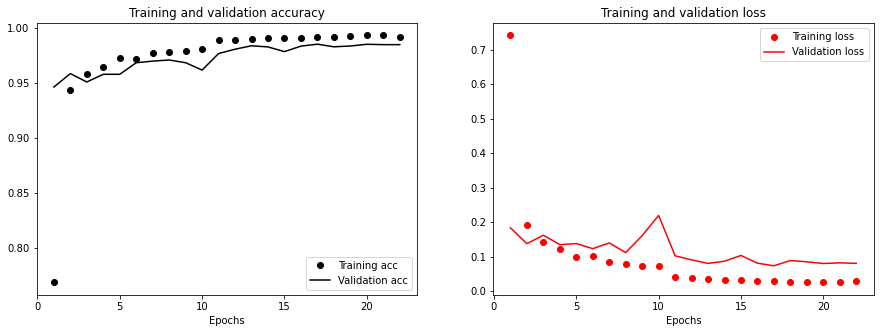

In [24]:
plot_results(vgg_history)

#### ResNet50

<center><b>Figure x. ResNet Network Architecture</b></center>

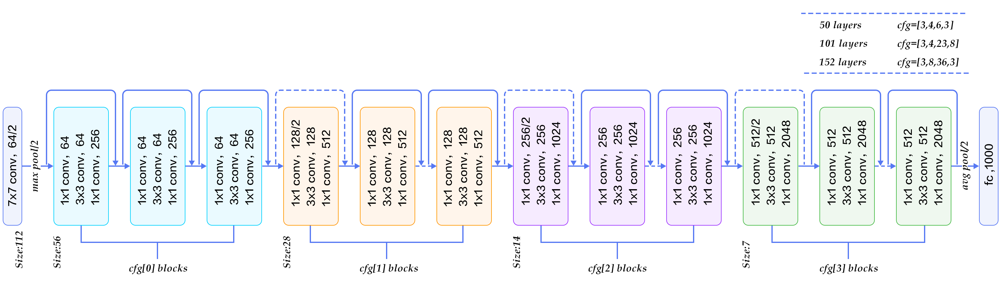

In [3]:
tf.keras.backend.clear_session()
gc.collect()

In [38]:
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_res50

resnet50 = tf.keras.applications.ResNet50(
    include_top=False,
    weights=None)

model_res50 = models.Sequential()

model_res50.add(layers.Lambda(preprocess_res50,
                             input_shape=(size, size, 3)))
model_res50.add(resnet50)
model_res50.add(layers.Flatten())
# model_res50.add(layers.Dense(32, activation="relu"))
# model_effb0.add(layers.Dropout(0.6))
model_res50.add(layers.Dense(num_labels, activation='softmax'))

model_res50.summary()

model_res50.compile(loss='categorical_crossentropy',
                    optimizer=optimizers.Adam(learning_rate=0.0001),
                    metrics=['accuracy'])

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda_1 (Lambda)            (None, 64, 64, 3)         0         
_________________________________________________________________
resnet50 (Functional)        (None, None, None, 2048)  23587712  
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 19)                155667    
Total params: 23,743,379
Trainable params: 23,690,259
Non-trainable params: 53,120
_________________________________________________________________


In [39]:
%%time

filepath_res = save_dir + "/base_res_wts.hdf5"
checkpoint_res = ModelCheckpoint(filepath_res, monitor='val_accuracy',
                             verbose=1, save_best_only=True, mode='max')
reduce_lr_res = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001, verbose=1)
earlystop_res = EarlyStopping(monitor='val_accuracy', patience=5, verbose=1)


res_history = model_res50.fit(
    keras_train_data,
    epochs=epochs,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    validation_data=keras_val_data,
    callbacks=[checkpoint_res, reduce_lr_res, earlystop_res]
)

Epoch 1/30
899/899 [==============================] - 123s 131ms/step - loss: 2.6374 - accuracy: 0.2764 - val_loss: 2.0328 - val_accuracy: 0.4513

Epoch 00001: val_accuracy improved from -inf to 0.45131, saving model to ./savefiles/base_res_wts.hdf5
Epoch 2/30
899/899 [==============================] - 115s 127ms/step - loss: 1.1996 - accuracy: 0.6260 - val_loss: 1.1956 - val_accuracy: 0.6686

Epoch 00002: val_accuracy improved from 0.45131 to 0.66858, saving model to ./savefiles/base_res_wts.hdf5
Epoch 3/30
899/899 [==============================] - 115s 127ms/step - loss: 0.7017 - accuracy: 0.7832 - val_loss: 0.7144 - val_accuracy: 0.8098

Epoch 00003: val_accuracy improved from 0.66858 to 0.80984, saving model to ./savefiles/base_res_wts.hdf5
Epoch 4/30
899/899 [==============================] - 110s 122ms/step - loss: 0.4655 - accuracy: 0.8600 - val_loss: 0.6326 - val_accuracy: 0.8337

Epoch 00004: val_accuracy improved from 0.80984 to 0.83372, saving model to ./savefiles/base_res_

In [41]:
model_res50.load_weights(filepath_res)

model_res50.save(save_dir + '/res50.h5')

with open(save_dir + '/res50_hist.pickle', 'wb') as handle:
    pickle.dump(res_history.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

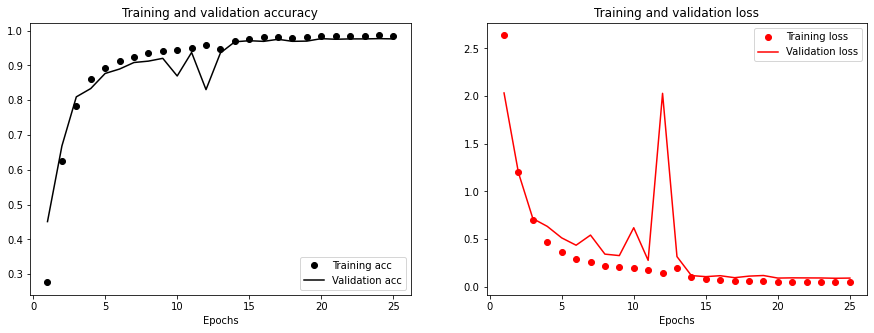

In [43]:
plot_results(res_history)

#### EfficientNetB0

<center><b>Figure x. EfficientNetB0 Network Architecture</b></center>

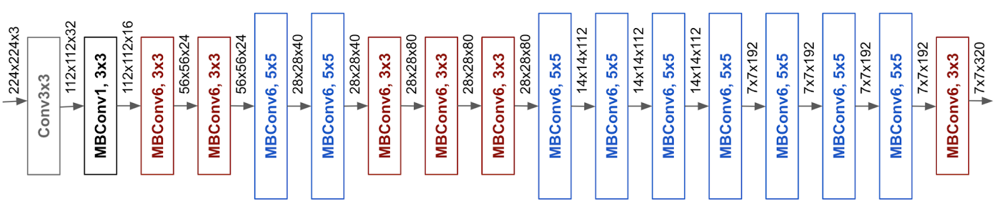

In [4]:
tf.keras.backend.clear_session()
gc.collect()

In [44]:
effnetb0 = tf.keras.applications.EfficientNetB0(
    include_top=False,
    weights=None,
    input_shape=(size, size, 3))

model_effb0 = models.Sequential()

model_effb0.add(effnetb0)
model_effb0.add(layers.Flatten())
# model_effb0.add(layers.Dense(32, activation="relu"))
# model_effb0.add(layers.Dropout(0.6))
model_effb0.add(layers.Dense(num_labels, activation='softmax'))

model_effb0.summary()

model_effb0.compile(loss='categorical_crossentropy',
                    optimizer=optimizers.Adam(learning_rate=0.0001),
                    metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnetb0 (Functional)  (None, 2, 2, 1280)        4049571   
_________________________________________________________________
flatten (Flatten)            (None, 5120)              0         
_________________________________________________________________
dense (Dense)                (None, 19)                97299     
Total params: 4,146,870
Trainable params: 4,104,847
Non-trainable params: 42,023
_________________________________________________________________


In [45]:
%%time

filepath_eff = save_dir + "/base_eff_wts.hdf5"
checkpoint_eff = ModelCheckpoint(filepath_eff, monitor='val_accuracy',
                             verbose=1, save_best_only=True, mode='max')
reduce_lr_eff = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001, verbose=1)
earlystop_eff = EarlyStopping(monitor='val_accuracy', patience=5, verbose=1)


eff_history = model_effb0.fit(
    keras_train_data,
    epochs=epochs,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    validation_data=keras_val_data,
    callbacks=[checkpoint_eff, reduce_lr_eff, earlystop_eff]
)

Epoch 1/30
899/899 [==============================] - 127s 130ms/step - loss: 2.9586 - accuracy: 0.1144 - val_loss: 7.9886 - val_accuracy: 0.1046

Epoch 00001: val_accuracy improved from -inf to 0.10457, saving model to ./savefiles/base_eff_wts.hdf5
Epoch 2/30
899/899 [==============================] - 110s 122ms/step - loss: 2.5397 - accuracy: 0.2229 - val_loss: 5.6488 - val_accuracy: 0.1860

Epoch 00002: val_accuracy improved from 0.10457 to 0.18599, saving model to ./savefiles/base_eff_wts.hdf5
Epoch 3/30
899/899 [==============================] - 112s 124ms/step - loss: 2.0065 - accuracy: 0.3571 - val_loss: 2.9666 - val_accuracy: 0.3832

Epoch 00003: val_accuracy improved from 0.18599 to 0.38324, saving model to ./savefiles/base_eff_wts.hdf5
Epoch 4/30
899/899 [==============================] - 113s 125ms/step - loss: 1.5145 - accuracy: 0.5040 - val_loss: 1.7189 - val_accuracy: 0.5303

Epoch 00004: val_accuracy improved from 0.38324 to 0.53034, saving model to ./savefiles/base_eff_

In [46]:
model_effb0.load_weights(filepath_eff)

model_effb0.save(save_dir + '/effb0.h5')

with open(save_dir + '/effb0_hist.pickle', 'wb') as handle:
    pickle.dump(eff_history.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

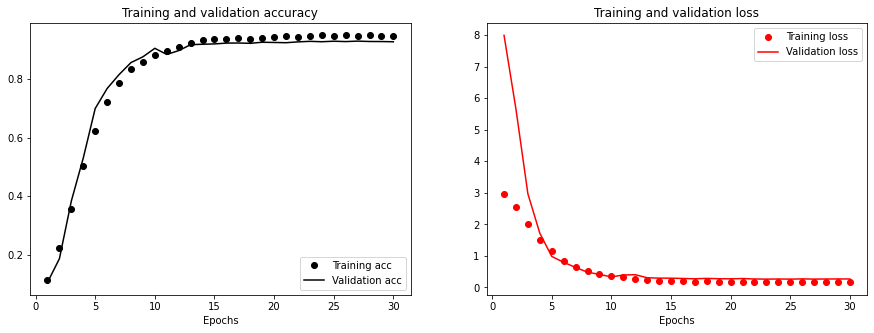

In [47]:
plot_results(eff_history)

#### CoAtNet0

<center><b>Figure x: CoAtNet0 Network Architecture</b></center>

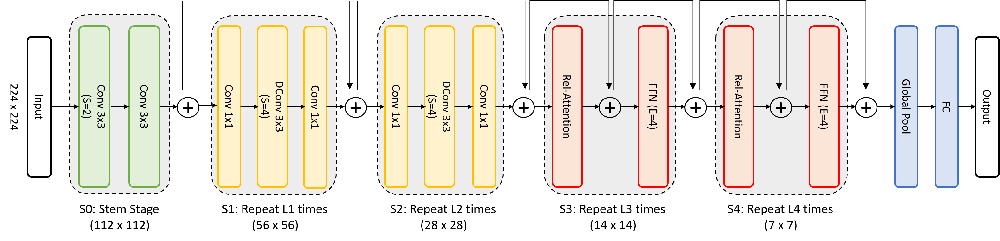

In [5]:
tf.keras.backend.clear_session()
gc.collect()

In [84]:
coatnet0 = keras_cv_attention_models.coatnet.CoAtNet0(num_classes=0,
                                                      pretrained=None,
                                                      input_shape=(size, size, 3))

model_coat0 = models.Sequential()

model_coat0.add(coatnet0)
model_coat0.add(layers.Flatten())
# model_coat0.add(layers.Dense(32, activation="relu"))
# model_coat0.add(layers.Dropout(0.6))
model_coat0.add(layers.Dense(num_labels, activation='softmax'))

model_coat0.summary()

model_coat0.compile(loss='categorical_crossentropy',
                   optimizer=optimizers.Adam(learning_rate=0.0001),
                   metrics=['accuracy'])

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
coatnet0 (Functional)        (None, 2, 2, 768)         23032698  
_________________________________________________________________
flatten_1 (Flatten)          (None, 3072)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 19)                58387     
Total params: 23,091,085
Trainable params: 23,079,437
Non-trainable params: 11,648
_________________________________________________________________


In [73]:
%%time

filepath_coat = save_dir + "/base_coat_wts.hdf5"
checkpoint_coat = ModelCheckpoint(filepath_coat, monitor='val_accuracy',
                             verbose=1, save_best_only=True, mode='max')
reduce_lr_coat = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001, verbose=1)
earlystop_coat= EarlyStopping(monitor='val_accuracy', patience=5, verbose=1)


coat_history = model_coat0.fit(
    keras_train_data,
    epochs=epochs,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    validation_data=keras_val_data,
    callbacks=[checkpoint_coat, reduce_lr_coat, earlystop_coat]
)

Epoch 1/30
899/899 [==============================] - 138s 138ms/step - loss: 2.1519 - accuracy: 0.6282 - val_loss: 0.9994 - val_accuracy: 0.8247

Epoch 00001: val_accuracy improved from -inf to 0.82475, saving model to ./savefiles/base_coat_wts.hdf5


/home/msds2022/nlapid/.conda/envs/msds2022-ml3/lib/python3.9/site-packages/keras/utils/generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/30
899/899 [==============================] - 119s 132ms/step - loss: 0.8063 - accuracy: 0.8394 - val_loss: 0.6910 - val_accuracy: 0.8637

Epoch 00002: val_accuracy improved from 0.82475 to 0.86374, saving model to ./savefiles/base_coat_wts.hdf5
Epoch 3/30
899/899 [==============================] - 117s 130ms/step - loss: 0.6343 - accuracy: 0.8824 - val_loss: 0.6891 - val_accuracy: 0.8864

Epoch 00003: val_accuracy improved from 0.86374 to 0.88636, saving model to ./savefiles/base_coat_wts.hdf5
Epoch 4/30
899/899 [==============================] - 116s 129ms/step - loss: 0.5349 - accuracy: 0.9031 - val_loss: 0.6355 - val_accuracy: 0.8984

Epoch 00004: val_accuracy improved from 0.88636 to 0.89835, saving model to ./savefiles/base_coat_wts.hdf5
Epoch 5/30
899/899 [==============================] - 116s 129ms/step - loss: 0.4747 - accuracy: 0.9162 - val_loss: 0.4197 - val_accuracy: 0.9281

Epoch 00005: val_accuracy improved from 0.89835 to 0.92807, saving model to ./savefiles/bas

In [74]:
model_coat0.load_weights(filepath_coat)

model_coat0.save(save_dir + '/coat0.h5')

with open(save_dir + '/coat0_hist.pickle', 'wb') as handle:
    pickle.dump(coat_history.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

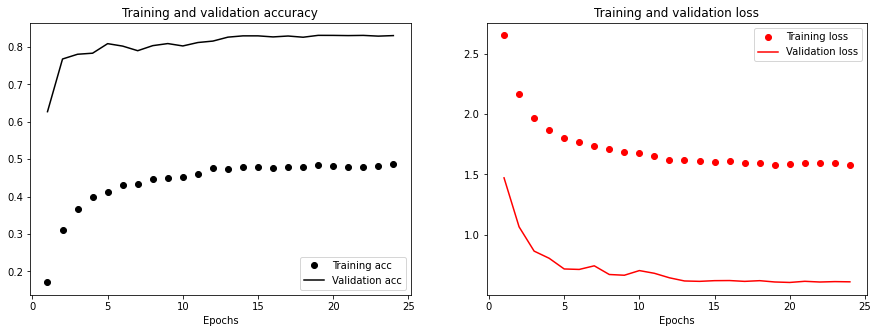

In [75]:
plot_results(base_cnn_history)

### Model Selection and Sample Prediction

Having trained the various models, it was a simple matter to compare the various test accuracies obtained. While all the architectures performed better than the baseline CNN model, it was clear that VGG16 had the best performance. Not only did it end up having the highest accuracy, but similar to ResNet50 and EfficientNetB0, its training plot was close to ideal as well, with no clear signs of overfitting or underfitting.

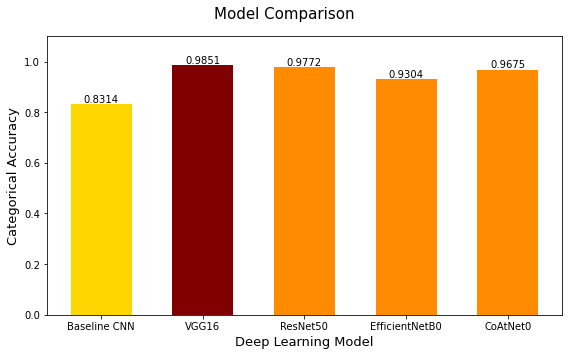

In [16]:
models = ['Baseline CNN', 'VGG16', 'ResNet50', 'EfficientNetB0', 'CoAtNet0']
scores = [.8314, .9851, .9772, .9304, .9675]
model_eval = pd.Series(scores, index=models)

fig, ax = plt.subplots(figsize=(8, 5))

pps = ax.bar(model_eval.index, model_eval.values, width=0.6,
             color=['gold', 'maroon', 'darkorange',
                    'darkorange', 'darkorange'])

for p in pps:
    height = p.get_height()
    ax.annotate('{}'.format(height),
      xy=(p.get_x() + p.get_width() / 2, height),
      xytext=(0, 0), # vertical offset
      textcoords="offset points",
      ha='center', va='bottom')

plt.ylim(0, 1.1)
plt.ylabel('Categorical Accuracy', fontsize=13)
plt.xlabel('Deep Learning Model', fontsize=13)
plt.suptitle('Model Comparison', fontsize=15)
plt.xticks(rotation='horizontal')
plt.tight_layout()
plt.show()

Given that VGG16 had the best performance, this was chosen as the preferred model for deployment. To demonstrate, it was used to predict the label of a sample image from the "a" vowel class. The VGG16 model was indeed able to classify the image correctly with a high degree of confidence.

It should be noted that this is only a sanity check, as the sample image was taken from the original dataset and may not be considered as unseen test data.

In [17]:
model = tf.keras.models.load_model(save_dir + 'vgg16_v2.h5')

Sample image:


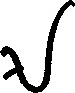

Predicted character: a
Prediction score: 99.7606%


In [18]:
img = cv2.imread(data_dir + 'a/a_00001_file001.jpg')
img = cv2.resize(img, (64, 64))
img = np.expand_dims(img, axis=0)

print('Sample image:')
im = Image.open(data_dir + 'a/a_00001_file001.jpg')
im.show()

predictions = model.predict(img)
pred_label = label_dict[np.argmax(predictions)]
probVal = np.amax(predictions)

print(f'Predicted character: {pred_label}')
print(f'Prediction score: {probVal:.4%}')

To deploy the model on new images, the team undertook to implement a real-time Optical Character Recognition Model, as demonstrated below. 

### Optical Character Recognition on Video

The researchers made a real-time OCR Baybayin recognition tool using `OpenCV`. The webcam or any USB camera connected to a computer can be used, or a video taken from a mobile phone can be uploaded using the codes below. The video format can be any of the popular video formats, but only .mov and .mp4 files were used for this study.

The threshold to display a prediction was set at 90%, but this tolerance can be set by the user.

In [ ]:
# Set the input type, either a video file or a live webcam. 
# Comment out the input type that will not be used.
# Note: this will only run on a local PC!!!

# If using a video file:
video = './OpenCV/ka_dara_nga_na.mp4'

# If using a webcam:
video = 0

In [ ]:
cap = cv2.VideoCapture(video)

if not cap.isOpened():
    print("Error loading the video file or camera")
    exit()

width = 640
height = 480
cap.set(3, width)
cap.set(4, height)

time_start = time.time()

while True:
    try:
        success, imgOriginal = cap.read()
        img = cv2.resize(imgOriginal, (64, 64))
        img = np.expand_dims(img, axis=0)

        #predict
        predictions = model.predict(img)
        pred_label = label_dict[np.argmax(predictions)]
        probVal = np.amax(predictions)
        
        threshold = 0.90
        if probVal > threshold:
            cv2.putText(img=imgOriginal, text=pred_label + ': ' + str(probVal),
                        org=(100, 100), fontFace=cv2.FONT_HERSHEY_COMPLEX,
                        fontScale=3, color=(255,255,0), thickness=3)
            print(pred_label, probVal)
        else:
            cv2.putText(img=imgOriginal, text='Unable to predict',
                        org=(100, 100), fontFace=cv2.FONT_HERSHEY_COMPLEX,
                        fontScale=3, color=(255,255,0), thickness=3)
#             print(pred_label, probVal)

        cv2.imshow('BaybAIyin Predictor', imgOriginal)

        time_now = time.time()
        num_seconds = time_now - time_start
        if num_seconds > 90:
            print('Time is up.')
            break

    except:
        print('Error: Closing camera')
        success = False
        cap.release()
        cv2.destroyAllWindows()
        break

    if (cv2.waitKey(1) & 0xFF == ord('q')):
        print('Camera or video closed by user')
        success = False
        cap.release()
        cv2.destroyAllWindows()
        break

    if not success:
        print('Failed to capture image')
        cap.release()
        cv2.destroyAllWindows()
        break


cap.release()
cv2.destroyAllWindows()
print('End of video')

The following shows the resulting predictions and the corresponding prediction score overlaid on a video taken of various baybayin characters recorded using a mobile phone camera.

In [19]:
from IPython.display import HTML

HTML("""
<video width="640" height="480" controls>
  <source src="OpenCV/baybayin3_demo.mp4" type="video/mp4">
</video>
""")

## <font color="93261e"> VIII. Conclusion </font>

This study demonstrated how deep learning can be used to further the Filipino heritage by classifying Baybayin using a base CNN and newer models such as VGG16, Resnet50, EfficientNetB0 and CoAtNet. The best performing model was VGG16 at 98.5% accuracy. Comparing our studies to the Image Classification on EMNIST-Letters shows that we are able to achieve comparable accuracy, with the highest accuracy in https://paperswithcode.com/sota/image-classification-on-emnist-letters at 95.88%.

There is value in our past, just as older models can outperform newer state of the art neural networks. This sstudy also demonstrated that using the appropriate model for a problem is important. The results show that 8-year old VGG16 beat the newer, state-of-the-art CoAtNet model.

The results of this study can be used by linguists, historians and researchers to help them translate and study baybayin text faster, and help revive a language, making it more accessible to the public.

## <font color="e8aa4b"> IX. Limitations and Recommendations </font>

The dataset used in this study only had 19 Baybayin characters written in a non-noisy image (white background). Expanding the dataset to include the other Baybayin variations and its diacritics, as well as introducing noise in the background, can help expand this study. If this model will be used at reading old text, whose paper or writing material can be stained with age or not inherently white, then the training may be adjusted to include more noise in the image.

The study can also be extended to inclde object detection models so the predictions are not dependent on video framing. It can be seen from the demonstration that the probability of the detection varies as the frame of the video moves.

There are also studies such as those done by Pino, Mendoza and Sambayan (2021) that detects baybayin characters alongside latin text. Translation of baybayin to other languages such as English or Spanish, or evaluating baybayin alongside latin text can also be explored.

## <font color="93261e"> X. Acknowledgements </font>

The output of this study would not have been possible if it weren't for the following people:
- **Prof. Leodegario Lorenzo II**, our mentor, for being patient as we consulted topic after topic after topic
- **Prof Mike, Prof Alva and Prof Basti** for teaching us the basics of deep learning and answering our questions and giving perspective on how to improve our study.

## <font color="e8aa4b"> XI. References </font>

https://alioshabielenberg.com/baybayin-and-nationalism/#:~:text=Baybayin%20is%20a%20writing%20system,at%20least%20the%20eighteenth%20century.&text=The%20word%20baybay%20means%20%E2%80%9Cto,written%20with%20the%20baybayin%20script.

https://github.com/jmbantay/Baybayin-Handwritten-Character-Dataset

Pino, R., Mendoza, R. and Sambayan, R. 2021. Optical character recognition system for Baybayin scripts using support vector machine. PeerJ Computing Science 2021 (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7959605/)

Philippine Congress. 2018. House approves Baybayin as national writing system (https://www.congress.gov.ph/press/details.php?pressid=10642 )

Bague, L. Jorda, R., Fortaleza, B. Evanculla, A. Paex, M. and Velasco, J. Recognition of Baybayin (Ancient Philippine Character) Handwritten Letters Using VGG16 Deep Convolutional Neural Network Model. 2020. International Journal of Emerging Trends in Engineering Research Volume 20 No. 9 September 2020 (http://www.warse.org/IJETER/static/pdf/file/ijeter55892020.pdf) 

Baybayin - Ancient Writing Script of the Philippines. (2021, July 20). Bayani Art. Retrieved March 13, 2022, from https://www.bayaniart.com/articles/baybayin/

Baybayin: The Ancient Filipino Script Lives On. (2019, October 26). Narra Studio. Retrieved March 15, 2022, from https://narrastudio.com/blogs/journal/baybayin-the-ancient-filipino-script-lives-on


(https://paperswithcode.com/sota/image-classification-on-emnist-letters)